In [ ]:
import cv2
import random
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
! gdown 1iT15C0qLWh9hIK1CDATzz2U1GzkHVwmO

Downloading...
From: https://drive.google.com/uc?id=1iT15C0qLWh9hIK1CDATzz2U1GzkHVwmO
To: /content/photo_2023-04-10_13-49-52.jpg
100% 58.6k/58.6k [00:00<00:00, 37.1MB/s]


In [ ]:
! gdown 1NLfNpQNLKbhyteoQEgbV2Z1i9-jVQdDN

Downloading...
From: https://drive.google.com/uc?id=1NLfNpQNLKbhyteoQEgbV2Z1i9-jVQdDN
To: /content/112.jpg
100% 25.1k/25.1k [00:00<00:00, 27.0MB/s]


In [ ]:
img1 = cv2.imread('/content/photo_2023-04-10_13-49-52.jpg', 0)
img2 = cv2.imread('/content/112.jpg', 0)

In [ ]:
def create_descriptors(img1, img2):
    gloh = cv2.xfeatures2d.SIFT_create()
    
    kp1, desc1 = gloh.detectAndCompute(img1, None)
    kp2, desc2 = gloh.detectAndCompute(img2, None)

    return kp1, desc1, kp2, desc2

In [ ]:
def draw_matches(img1, kp1, img2, kp2, matches, matches_number=10):
  result = cv2.drawMatches(
      img1, kp1, img2, kp2, matches[:matches_number], None, flags=4
  )
  return result

In [ ]:
def gloh_flann_matcher(img1, img2):

  kp1, desc1, kp2, desc2 = create_descriptors(img1, img2)

  matcher = cv2.FlannBasedMatcher_create()

  matches = matcher.match(desc1, desc2)
  matches = sorted(matches, key=lambda x: x.distance)

  return draw_matches(img1, kp1, img2, kp2, matches)

In [ ]:
def gloh_custom_matcher(img1, img2):

  kp1, desc1, kp2, desc2 = create_descriptors(img1, img2)

  matches = []

  for i, d1 in enumerate(desc1, start=0):
      for j, d2 in enumerate(desc2, start=0):
          matches.append(cv2.DMatch(_trainIdx=j, _queryIdx=i, _distance=np.linalg.norm(d1 - d2, ord=2), _imgIdx=0))

  matches = sorted(matches, key=lambda sample: sample.distance)

  return draw_matches(img1, kp1, img2, kp2, matches)

In [ ]:
def visualize(image):
    plt.figure(figsize=(25, 25))
    plt.imshow(image)

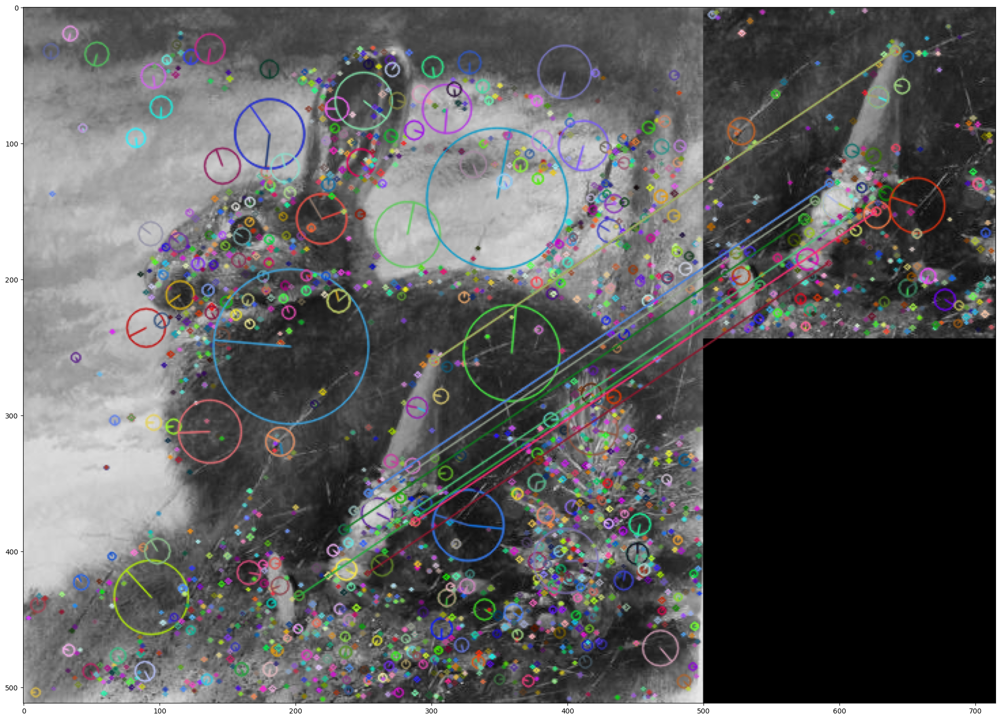

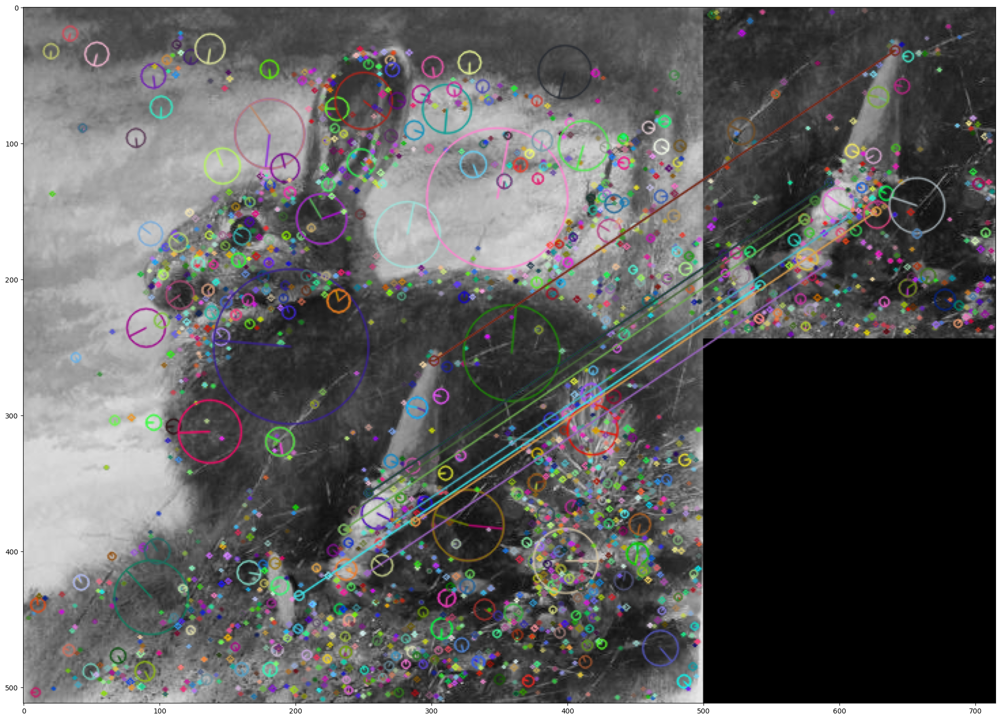

In [ ]:
visualize(image=gloh_flann_matcher(img1, img2))
visualize(image=gloh_custom_matcher(img1, img2))

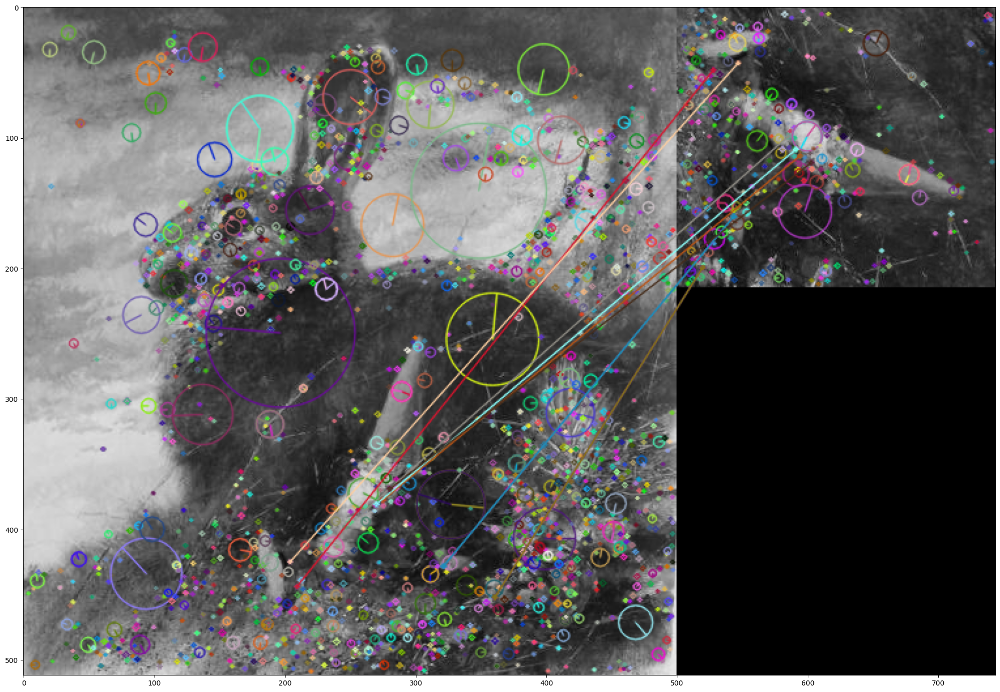

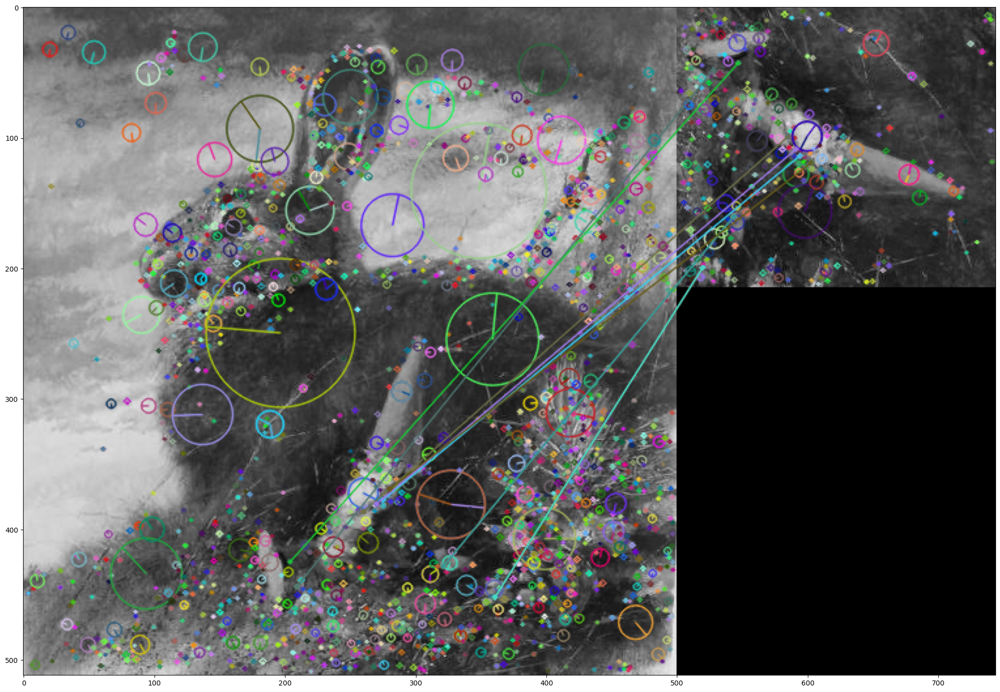

In [ ]:
img90 = cv2.rotate(img2, cv2.ROTATE_90_CLOCKWISE)
visualize(image=gloh_flann_matcher(img1, img90))
visualize(image=gloh_custom_matcher(img1, img90))